## Config

In [13]:
# ================= CONFIGURATION =================
RAW_DATA_ROOT = "datasets/plastic_coco"
TEMP_JSON_DIR = "datasets/plastic_coco/temp_fixed_json"

YOLO_ORIGINAL_OUTPUT_DIR = "datasets/plastic_ori_yolo"

SLICED_DATA_DIR = "datasets/plastic_sliced_coco"
YOLO_SLICED_OUTPUT_DIR = "datasets/plastic_sliced_yolo"

FINAL_OUTPUT_DIR = "datasets/plastic_final_yolo"

NEGATIVES_DIR = "datasets/beach_negatives_downsampled"  # <--- Source of negative images

SLICE_SIZE = 640
OVERLAP_RATIO = 0.2
MIN_AREA = 64

DATA_SPLITS = [
    ("train", "train.json", "images/train"), 
    ("val",   "val.json",   "images/val"),
    ("test",  "test.json",  "images/test")
]
# =================================================

## Fix COCO JSON

In [2]:
import json
import os
import shutil
import numpy as np
from shapely.geometry import Polygon, MultiPolygon
from shapely.validation import make_valid
from pycocotools import mask as mask_utils
import cv2
from tqdm import tqdm  # Integrated tqdm

def rle_to_polygon(segmentation, height, width):
    """ Converts RLE to Polygon (OpenCV Style). """
    try:
        if isinstance(segmentation, dict) and isinstance(segmentation.get('counts'), str):
            segmentation['counts'] = segmentation['counts'].encode('utf-8')
            binary_mask = mask_utils.decode([segmentation])[:, :, 0]
        elif isinstance(segmentation, dict) and isinstance(segmentation.get('counts'), list):
            rle = mask_utils.frPyObjects(segmentation, height, width)
            binary_mask = mask_utils.decode(rle)
        elif isinstance(segmentation, list):
            rle = mask_utils.frPyObjects(segmentation, height, width)
            binary_mask = mask_utils.decode(rle)
        else:
            return []

        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        polygons = []
        for contour in contours:
            if contour.size >= 6: 
                polygons.append(contour.flatten().tolist())
        return polygons
    except Exception:
        return []

def fix_polygon_geometry(poly):
    """ Magic fix for broken polygons. """
    if not poly.is_valid:
        poly = make_valid(poly)
    
    poly = poly.buffer(0)
    
    if isinstance(poly, MultiPolygon):
        if len(poly.geoms) > 0:
            poly = max(poly.geoms, key=lambda p: p.area)
        else:
            return None
            
    if poly.is_empty or poly.area < MIN_AREA:
        return None
        
    return poly

def scorched_earth_cleaning(annotations):
    clean_anns = []
    fixed_coords = 0
    purged_anns = 0  # Counter for objects deleted due to missing segments
    dropped_small = 0 
    
    # Integrated tqdm here for cleaning process
    for ann in tqdm(annotations, desc="    - Cleaning & Repairing", unit="ann"):
        # 1. Sanitize BBox
        if 'bbox' in ann:
            x, y, w, h = ann['bbox']
            if w < 2: 
                w = 2
            if h < 2: 
                h = 2
            ann['bbox'] = [x, y, w, h]
            bbox_area = w * h
        else:
            continue

        # 2. Fix Segmentation
        valid_seg = False
        final_area = bbox_area 
        
        if 'segmentation' in ann and isinstance(ann['segmentation'], list) and len(ann['segmentation']) > 0:
            try:
                raw_coords = ann['segmentation'][0]
                # Check for at least 3 points (6 coords)
                if len(raw_coords) >= 6:
                    pts = np.array(raw_coords).reshape(-1, 2)
                    shapely_poly = Polygon(pts)
                    
                    clean_poly = fix_polygon_geometry(shapely_poly)
                    
                    if clean_poly is not None:
                        new_coords = np.array(clean_poly.exterior.coords).flatten().tolist()
                        ann['segmentation'] = [new_coords]
                        final_area = clean_poly.area
                        valid_seg = True
                        fixed_coords += 1
            except Exception:
                valid_seg = False

        # 3. GLOBAL SIZE CHECK 
        if final_area < MIN_AREA:
            dropped_small += 1
            continue 

        # 4. Finalize Structure (STRICT MODE)
        if valid_seg:
            ann['area'] = final_area
            ann['iscrowd'] = 0
            clean_anns.append(ann)
        else:
            # --- STRICT DELETION ---
            # If valid_seg is False, we completely ignore this annotation.
            # We do NOT append it to clean_anns.
            purged_anns += 1
            continue

    print(f"    - Scorched Earth Report:")
    print(f"      FIXED: {fixed_coords} polygons (geometry repaired)")
    print(f"      DROPPED: {dropped_small} objects (area < {MIN_AREA})")
    print(f"      PURGED: {purged_anns} objects removed (No valid segmentation found)")
    return clean_anns

def inject_negatives(data, target_img_folder):
    """
    Copies images from NEGATIVES_DIR to target_img_folder.
    Adds them to the COCO JSON 'images' list.
    Does NOT add to 'annotations' list (Standard COCO way to define negatives).
    """
    if not os.path.exists(NEGATIVES_DIR):
        print(f"    ! Warning: Negative directory '{NEGATIVES_DIR}' not found. Skipping.")
        return data

    print(f"    + Injecting negatives from: {NEGATIVES_DIR}")
    
    # Calculate starting ID to avoid conflicts
    current_ids = [img['id'] for img in data['images']]
    next_id = (max(current_ids) + 1) if current_ids else 1
    
    neg_files = [f for f in os.listdir(NEGATIVES_DIR) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    added_count = 0

    # Integrated tqdm here for file copying
    for fname in tqdm(neg_files, desc="    - Processing Negatives", unit="img"):
        src_path = os.path.join(NEGATIVES_DIR, fname)
        dst_path = os.path.join(target_img_folder, fname)
        
        # 1. Copy Image File
        try:
            shutil.copy2(src_path, dst_path)
        except Exception as e:
            print(f"      Error copying {fname}: {e}")
            continue

        # 2. Get Dimensions
        img = cv2.imread(src_path)
        if img is None:
            print(f"      Error reading {fname}, skipping.")
            continue
        h, w = img.shape[:2]

        # 3. Add to JSON 'images' list
        data['images'].append({
            "id": next_id,
            "file_name": fname, # Assumes flat directory structure in images/train
            "width": w,
            "height": h,
            "license": 0,
            "date_captured": ""
        })
        
        next_id += 1
        added_count += 1
        
    print(f"      Successfully added {added_count} negative images (Background only).")
    return data

def fix_json_phase1(split_name, json_filename, relative_img_path):
    """ Phase 1: RLE -> Scorched Earth Fix -> Inject Negatives -> Save """
    input_json = os.path.join(RAW_DATA_ROOT, "annotation", json_filename)
    output_json = os.path.join(TEMP_JSON_DIR, json_filename)
    
    print(f"Fixing JSON for {split_name.upper()}...")
    with open(input_json, 'r') as f:
        data = json.load(f)

    # --- NEW: Inject Negatives (Train Only) ---
    # if split_name == "train":
    #     full_train_img_path = os.path.join(RAW_DATA_ROOT, relative_img_path)
    #     # Ensure directory exists before copying
    #     os.makedirs(full_train_img_path, exist_ok=True) 
    #     data = inject_negatives(data, full_train_img_path)
    # ------------------------------------------

    img_dims = {img['id']: (img['height'], img['width']) for img in data['images']}
    processed_anns = []

    # Step A: RLE Conversion
    # Integrated tqdm here for RLE conversion loop
    for ann in tqdm(data['annotations'], desc="    - RLE Conversion", unit="ann"):
        if ann['image_id'] not in img_dims:
            continue
        
        if 'segmentation' in ann and isinstance(ann['segmentation'], dict) and 'counts' in ann['segmentation']:
            polygons = rle_to_polygon(ann['segmentation'], *img_dims[ann['image_id']])
            if polygons:
                ann['segmentation'] = polygons
                processed_anns.append(ann)
        else:
            processed_anns.append(ann)

    # Step B: Scorched Earth Cleaning
    data['annotations'] = scorched_earth_cleaning(processed_anns)
    
    os.makedirs(os.path.dirname(output_json), exist_ok=True)
    with open(output_json, 'w') as f:
        json.dump(data, f)
    
    return output_json

# ================= EXECUTION =================

if os.path.exists(YOLO_SLICED_OUTPUT_DIR):
    shutil.rmtree(YOLO_SLICED_OUTPUT_DIR)
if os.path.exists(TEMP_JSON_DIR):
    shutil.rmtree(TEMP_JSON_DIR)

# --- PHASE 1 ---
for split, json_file, src_folder in DATA_SPLITS:
    # Updated to pass src_folder (e.g., "images/train")
    fixed_json_path = fix_json_phase1(split, json_file, src_folder)

Fixing JSON for TRAIN...


    - Cleaning & Repairing: 100%|██████████| 73721/73721 [00:08<00:00, 9184.20ann/s]


    - Scorched Earth Report:
      FIXED: 36784 polygons (geometry repaired)
      DROPPED: 22050 objects (area < 64)
      PURGED: 14887 objects removed (No valid segmentation found)
Fixing JSON for VAL...


    - Cleaning & Repairing: 100%|██████████| 22960/22960 [00:02<00:00, 9558.38ann/s] 


    - Scorched Earth Report:
      FIXED: 11179 polygons (geometry repaired)
      DROPPED: 7165 objects (area < 64)
      PURGED: 4616 objects removed (No valid segmentation found)
Fixing JSON for TEST...


    - Cleaning & Repairing: 100%|██████████| 22268/22268 [00:02<00:00, 7501.35ann/s]


    - Scorched Earth Report:
      FIXED: 12212 polygons (geometry repaired)
      DROPPED: 5982 objects (area < 64)
      PURGED: 4074 objects removed (No valid segmentation found)


## Slice

In [5]:
from sahi.slicing import slice_coco
import os

def slice_dataset(split_name, json_path, src_folder_name):
    image_dir = os.path.join(RAW_DATA_ROOT, src_folder_name)
    output_dir = os.path.join(SLICED_DATA_DIR, 'images', split_name)
    
    print(f"Slicing {split_name.upper()}...")
    
    coco_dict, result_path = slice_coco(
        coco_annotation_file_path=json_path,
        image_dir=image_dir,
        output_coco_annotation_file_name=split_name,
        output_dir=output_dir,
        slice_height=SLICE_SIZE,
        slice_width=SLICE_SIZE,
        overlap_height_ratio=OVERLAP_RATIO,
        overlap_width_ratio=OVERLAP_RATIO,
        min_area_ratio=0.1, 
        verbose=False 
    )

    return result_path, output_dir


sliced_json_paths = [] 

for split, json_file, src_folder in DATA_SPLITS:
    fixed_json_path = os.path.join(TEMP_JSON_DIR, json_file)
    sliced_json_path, sliced_img_dir = slice_dataset(split, fixed_json_path, src_folder)
    sliced_json_paths.append((split, sliced_json_path, sliced_img_dir))


Slicing TRAIN...


100%|██████████| 2226/2226 [02:02<00:00, 18.21it/s]


Slicing VAL...


100%|██████████| 742/742 [00:47<00:00, 15.72it/s]


Slicing TEST...


100%|██████████| 741/741 [00:45<00:00, 16.36it/s]


In [6]:
from pathlib import Path
import shutil

for split, json_path, _ in sliced_json_paths:
    new_name = json_path.stem.replace("_coco", "") + json_path.suffix
    destination = Path(f"{SLICED_DATA_DIR}/annotated") / new_name

    destination.parent.mkdir(parents=True, exist_ok=True)
    shutil.move(json_path, destination)

    print(f"Moved {json_path} -> {destination}")

Moved datasets\plastic_sliced_coco\images\train\train_coco.json -> datasets\plastic_sliced_coco\annotated\train.json
Moved datasets\plastic_sliced_coco\images\val\val_coco.json -> datasets\plastic_sliced_coco\annotated\val.json
Moved datasets\plastic_sliced_coco\images\test\test_coco.json -> datasets\plastic_sliced_coco\annotated\test.json


## Convert Sliced to YOLO txt

In [7]:
from ultralytics.data.converter import convert_coco

convert_coco(
    labels_dir=os.path.join(SLICED_DATA_DIR, "annotated"),
    save_dir=YOLO_SLICED_OUTPUT_DIR,
    use_segments=True,
    use_keypoints=False,
)

Annotations C:\Users\ASUS\projects\ai-plastic-spotter\train\datasets\plastic_sliced_coco\annotated\test.json: 100% ━━━━━━━━━━━━ 1947/1947 1.2Kit/s 1.6s0.1s
Annotations C:\Users\ASUS\projects\ai-plastic-spotter\train\datasets\plastic_sliced_coco\annotated\train.json: 100% ━━━━━━━━━━━━ 5896/5896 959.1it/s 6.1s0.1s
Annotations C:\Users\ASUS\projects\ai-plastic-spotter\train\datasets\plastic_sliced_coco\annotated\val.json: 100% ━━━━━━━━━━━━ 1910/1910 973.8it/s 2.0s0.0s
COCO data converted successfully.
Results saved to C:\Users\ASUS\projects\ai-plastic-spotter\train\datasets\plastic_sliced_yolo


In [8]:
from ultralytics.data.converter import convert_coco

convert_coco(
    labels_dir=os.path.join(TEMP_JSON_DIR),
    save_dir=YOLO_ORIGINAL_OUTPUT_DIR,
    use_segments=True,
    use_keypoints=False,
)

Annotations C:\Users\ASUS\projects\ai-plastic-spotter\train\datasets\plastic_coco\temp_fixed_json\test.json: 100% ━━━━━━━━━━━━ 702/702 807.6it/s 0.9s0.1s
Annotations C:\Users\ASUS\projects\ai-plastic-spotter\train\datasets\plastic_coco\temp_fixed_json\train.json: 100% ━━━━━━━━━━━━ 2117/2117 806.3it/s 2.6s0.1s
Annotations C:\Users\ASUS\projects\ai-plastic-spotter\train\datasets\plastic_coco\temp_fixed_json\val.json: 100% ━━━━━━━━━━━━ 710/710 880.9it/s 0.8s0.1s
COCO data converted successfully.
Results saved to C:\Users\ASUS\projects\ai-plastic-spotter\train\datasets\plastic_ori_yolo


## Downsample Original Images

Take images from RAW_DATA_ROOT/images and downsample them to SLICE_SIZE if larger (preserve aspect ratio).
If it is smaller or equal to SLICE_SIZE, don't create a copy in output.
Output to YOLO_ORIGINAL_OUTPUT_DIR.

In [10]:
import os
import cv2
from tqdm import tqdm

IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp")

def _iter_images(folder):
    for root, _, files in os.walk(folder):
        for fname in files:
            if fname.lower().endswith(IMG_EXTS):
                yield root, fname

def downsample_if_needed(src_path, dst_path, max_side):
    img = cv2.imread(src_path)
    if img is None:
        return False, "unreadable"
    h, w = img.shape[:2]
    longest = max(h, w)
    if longest <= max_side:
        return False, "skipped_small"
    scale = max_side / float(longest)
    new_w = max(1, int(round(w * scale)))
    new_h = max(1, int(round(h * scale)))
    resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
    os.makedirs(os.path.dirname(dst_path), exist_ok=True)
    ok = cv2.imwrite(dst_path, resized)
    return bool(ok), "downsampled" if ok else "write_failed"

# ============== EXECUTION ==============
print("Downsampling originals (only when larger than SLICE_SIZE)...")

total_seen = 0
total_downsampled = 0
total_skipped_small = 0
total_unreadable = 0
total_write_failed = 0

for split, _, relative_img_path in DATA_SPLITS:
    src_dir = os.path.join(RAW_DATA_ROOT, relative_img_path)
    dst_dir = os.path.join(YOLO_ORIGINAL_OUTPUT_DIR, "images", split)
    if not os.path.exists(src_dir):
        print(f"  ! Missing source dir: {src_dir} (skipping {split})")
        continue

    # Count first for nice tqdm totals
    all_imgs = list(_iter_images(src_dir))
    print(f"  {split}: found {len(all_imgs)} images")

    for root, fname in tqdm(all_imgs, desc=f"  - {split} downsample", unit="img"):
        total_seen += 1
        src_path = os.path.join(root, fname)
        dst_path = os.path.join(dst_dir, fname)
        ok, status = downsample_if_needed(src_path, dst_path, SLICE_SIZE)
        if status == "downsampled":
            total_downsampled += 1
        elif status == "skipped_small":
            total_skipped_small += 1
        elif status == "unreadable":
            total_unreadable += 1
        elif status == "write_failed":
            total_write_failed += 1

print("Done.")
print(f"  Total seen:        {total_seen}")
print(f"  Downsampled:       {total_downsampled}")
print(f"  Skipped (<=size):  {total_skipped_small}")
print(f"  Unreadable:        {total_unreadable}")
print(f"  Write failed:      {total_write_failed}")

Downsampling originals (only when larger than SLICE_SIZE)...
  train: found 2226 images


  - train downsample: 100%|██████████| 2226/2226 [00:48<00:00, 45.52img/s]


  val: found 742 images


  - val downsample: 100%|██████████| 742/742 [00:16<00:00, 46.23img/s]


  test: found 741 images


  - test downsample: 100%|██████████| 741/741 [00:17<00:00, 43.56img/s]

Done.
  Total seen:        3709
  Downsampled:       2674
  Skipped (<=size):  1035
  Unreadable:        0
  Write failed:      0


Remove Labels in YOLO_ORIGINAL_OUTPUT_DIR that do not have corresponding images.

In [11]:
import os
from pathlib import Path
from tqdm import tqdm

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def _collect_image_stems(images_dir: Path) -> set[str]:
    stems: set[str] = set()
    if not images_dir.exists():
        return stems
    for p in images_dir.rglob("*"):
        if p.is_file() and p.suffix.lower() in IMG_EXTS:
            stems.add(p.stem)
    return stems

def remove_orphan_labels(yolo_root: str, splits=("train", "val", "test"), dry_run: bool = True) -> None:
    """
    Remove YOLO label .txt files that do not have a corresponding image in the same split.

    Matching rule: label file stem must match an image file stem (any extension).
    """
    yolo_root = str(yolo_root)
    base = Path(yolo_root)
    labels_base = base / "labels"
    images_base = base / "images"

    total_seen = 0
    total_removed = 0
    total_kept = 0
    total_missing_split_dirs = 0

    print(f"Removing orphan labels under: {base}")
    print(f"  dry_run={dry_run}")

    for split in splits:
        labels_dir = labels_base / split
        images_dir = images_base / split

        if not labels_dir.exists():
            print(f"  - {split}: labels dir missing, skipping ({labels_dir})")
            total_missing_split_dirs += 1
            continue
        if not images_dir.exists():
            print(f"  - {split}: images dir missing; all labels would be orphaned, skipping ({images_dir})")
            total_missing_split_dirs += 1
            continue

        image_stems = _collect_image_stems(images_dir)
        label_files = sorted([p for p in labels_dir.rglob("*.txt") if p.is_file()])

        removed = 0
        kept = 0

        for label_path in tqdm(label_files, desc=f"  - {split} prune labels", unit="label"):
            total_seen += 1
            if label_path.stem not in image_stems:
                removed += 1
                total_removed += 1
                if not dry_run:
                    try:
                        label_path.unlink()
                    except Exception as e:
                        print(f"    ! Failed to delete {label_path}: {e}")
            else:
                kept += 1
                total_kept += 1

        print(f"  - {split}: images={len(image_stems)} labels={len(label_files)} kept={kept} removed={removed}")

    print("Done.")
    print(f"  Total labels scanned: {total_seen}")
    print(f"  Total kept:          {total_kept}")
    print(f"  Total removed:       {total_removed}")
    if total_missing_split_dirs:
        print(f"  Splits skipped due to missing dirs: {total_missing_split_dirs}")

# ============== EXECUTION ==============
# Safety default is dry_run=True; set to False once the report looks correct.
remove_orphan_labels(YOLO_ORIGINAL_OUTPUT_DIR, splits=[s for s, *_ in DATA_SPLITS], dry_run=True)

Removing orphan labels under: datasets\plastic_ori_yolo
  dry_run=True


  - train prune labels: 100%|██████████| 2117/2117 [00:00<00:00, 1054178.03label/s]


  - train: images=1599 labels=2117 kept=1517 removed=600


  - val prune labels: 100%|██████████| 710/710 [00:00<?, ?label/s]


  - val: images=517 labels=710 kept=493 removed=217


  - test prune labels: 100%|██████████| 702/702 [00:00<?, ?label/s]

  - test: images=558 labels=702 kept=528 removed=174
Done.
  Total labels scanned: 3529
  Total kept:          2538
  Total removed:       991


## Merge YOLO Datasets

Merge YOLO_SLICED_OUTPUT_DIR and YOLO_ORIGINAL_OUTPUT_DIR into FINAL_OUTPUT_DIR.

Images that have multiple slices should have a downsampled original image as global context. (In the downsample step, we have already taken care of this.)

In [16]:
import shutil
from pathlib import Path
from typing import Iterable, Optional
from tqdm import tqdm

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def _iter_images_in_split(images_dir: Path) -> Iterable[Path]:
    if not images_dir.exists():
        return
    for p in images_dir.rglob("*"):
        if p.is_file() and p.suffix.lower() in IMG_EXTS:
            yield p

def _safe_copy(src: Path, dst: Path, dry_run: bool) -> None:
    dst.parent.mkdir(parents=True, exist_ok=True)
    if dry_run:
        return
    shutil.copy2(src, dst)

def _next_available_name(taken: set[str], filename: str, prefix: str) -> str:
    """Return a filename that isn't in `taken` by adding prefix/increment."""
    if filename not in taken:
        return filename

    stem = Path(filename).stem
    suffix = Path(filename).suffix
    prefixed = f"{prefix}{stem}{suffix}"
    if prefixed not in taken:
        return prefixed

    i = 1
    while True:
        alt = f"{prefix}{stem}_{i}{suffix}"
        if alt not in taken:
            return alt
        i += 1

def _count_images(images_root: Path, splits: Iterable[str]) -> int:
    total = 0
    for split in splits:
        split_dir = images_root / split
        if split_dir.exists():
            for p in split_dir.rglob("*"):
                if p.is_file() and p.suffix.lower() in IMG_EXTS:
                    total += 1
    return total

def merge_yolo_datasets(
    sources: list[tuple[str, str, str]],
    final_root: str,
    splits: Iterable[str] = ("train", "val", "test"),
    clean_final_dir: bool = False,
    dry_run: bool = True,
    write_yaml_path: Optional[str] = "bepli_final.yaml",
    class_names: Optional[dict[int, str]] = None,
    ) -> None:
    """
    Merge multiple YOLO datasets into a single YOLO dataset.

    Each source is a tuple: (images_root, labels_root, collision_prefix)
      - images_root must contain split folders (train/val/test) of images
      - labels_root must contain split folders (train/val/test) of YOLO .txt labels
        (it can be missing; labels are copied only when present)
    """
    final_root_p = Path(final_root)
    split_list = list(splits)

    # Safety: don't delete FINAL_OUTPUT_DIR if we can't see any images to merge.
    if clean_final_dir and (not dry_run):
        total_src_imgs = 0
        for images_root, _, prefix in sources:
            images_root_p = Path(images_root)
            n = _count_images(images_root_p, split_list)
            print(f"Preflight: {prefix} images_root={images_root_p} images={n}")
            total_src_imgs += n
        if total_src_imgs == 0:
            raise RuntimeError("Refusing to clean/merge: no source images found. Check images_root paths and splits.")

    if clean_final_dir and final_root_p.exists():
        print(f"Cleaning FINAL_OUTPUT_DIR: {final_root_p}")
        if not dry_run:
            shutil.rmtree(final_root_p)

    print("Merging YOLO datasets -> FINAL_OUTPUT_DIR")
    print(f"  final_root={final_root_p}")
    print(f"  clean_final_dir={clean_final_dir} dry_run={dry_run}")

    taken_by_split: dict[str, set[str]] = {}
    for split in split_list:
        dst_images_split = final_root_p / "images" / split
        dst_images_split.mkdir(parents=True, exist_ok=True)
        if clean_final_dir:
            taken_by_split[split] = set()
        else:
            existing = {p.name for p in dst_images_split.iterdir() if p.is_file()} if dst_images_split.exists() else set()
            taken_by_split[split] = set(existing)

    total_images = 0
    total_labels = 0
    total_collisions = 0
    missing_sources = 0

    for images_root, labels_root, prefix in sources:
        images_root_p = Path(images_root)
        labels_root_p = Path(labels_root)

        if not images_root_p.exists():
            print(f"  ! Missing images_root: {images_root_p}")
            missing_sources += 1
            continue

        print(f"  + Source: images_root={images_root_p} labels_root={labels_root_p} (collision_prefix='{prefix}')")

        for split in split_list:
            src_images_split = images_root_p / split
            src_labels_split = labels_root_p / split
            dst_images_split = final_root_p / "images" / split
            dst_labels_split = final_root_p / "labels" / split
            dst_labels_split.mkdir(parents=True, exist_ok=True)

            images = list(_iter_images_in_split(src_images_split))
            if not images:
                continue

            taken = taken_by_split[split]
            for img_path in tqdm(images, desc=f"  - merge {prefix}{split}", unit="img"):
                desired_name = img_path.name
                final_name = _next_available_name(taken, desired_name, prefix)
                if final_name != desired_name:
                    total_collisions += 1
                taken.add(final_name)

                dst_img_path = dst_images_split / final_name
                _safe_copy(img_path, dst_img_path, dry_run=dry_run)
                total_images += 1

                src_label_path = src_labels_split / f"{img_path.stem}.txt"
                if src_label_path.exists():
                    dst_label_path = dst_labels_split / f"{Path(final_name).stem}.txt"
                    _safe_copy(src_label_path, dst_label_path, dry_run=dry_run)
                    total_labels += 1

    print("Done.")
    print(f"  Images merged:      {total_images}")
    print(f"  Labels merged:      {total_labels}")
    print(f"  Name collisions:    {total_collisions}")
    if missing_sources:
        print(f"  Missing sources:    {missing_sources}")

    if write_yaml_path:
        if class_names is None:
            class_names = {0: "plastic_litter"}
        yaml_text = "\n".join([
            f"path: ./{final_root_p.as_posix()}",
            "train: images/train",
            "val: images/val",
            "test: images/test",
            "",
            "names:",
            *[f"  {k}: {v}" for k, v in sorted(class_names.items())],
            "",
        ])
        out_yaml = Path(write_yaml_path)
        print(f"Writing dataset yaml: {out_yaml}")
        if not dry_run:
            out_yaml.write_text(yaml_text, encoding="utf-8")

# ============== EXECUTION ==============
# Sliced images live under SLICED_DATA_DIR/images/<split>.
# Sliced labels live under YOLO_SLICED_OUTPUT_DIR/labels/<split>.
merge_yolo_datasets(
    sources=[
        (str(Path(SLICED_DATA_DIR) / "images"), str(Path(YOLO_SLICED_OUTPUT_DIR) / "labels"), "sli_"),
        (str(Path(YOLO_ORIGINAL_OUTPUT_DIR) / "images"), str(Path(YOLO_ORIGINAL_OUTPUT_DIR) / "labels"), "ori_"),
    ],
    final_root=FINAL_OUTPUT_DIR,
    splits=[s for s, *_ in DATA_SPLITS],
    clean_final_dir=True,
    dry_run=False,
    write_yaml_path="bepli_final.yaml",
    class_names={0: "plastic_litter"},
 )

Preflight: sli_ images_root=datasets\plastic_sliced_coco\images images=11655
Preflight: ori_ images_root=datasets\plastic_ori_yolo\images images=2674
Cleaning FINAL_OUTPUT_DIR: datasets\plastic_final_yolo
Merging YOLO datasets -> FINAL_OUTPUT_DIR
  final_root=datasets\plastic_final_yolo
  clean_final_dir=True dry_run=False
  + Source: images_root=datasets\plastic_sliced_coco\images labels_root=datasets\plastic_sliced_yolo\labels (collision_prefix='sli_')


  - merge sli_test: 100%|██████████| 2487/2487 [00:05<00:00, 431.00img/s]


  + Source: images_root=datasets\plastic_ori_yolo\images labels_root=datasets\plastic_ori_yolo\labels (collision_prefix='ori_')


  - merge ori_test: 100%|██████████| 558/558 [00:00<00:00, 561.93img/s]

Done.
  Images merged:      14329
  Labels merged:      12291
  Name collisions:    0
Writing dataset yaml: bepli_final.yaml


## Final Filtering

Filter out labels in FINAL_OUTPUT_DIR that have area less than MIN_AREA.

In [18]:
import os
from pathlib import Path
from typing import Optional
import cv2
from tqdm import tqdm

# Reuse IMG_EXTS if defined above; otherwise define it here.
try:
    _IMG_EXTS = IMG_EXTS  # noqa: F821
except Exception:
    _IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def _find_image_for_label(images_split_dir: Path, label_stem: str) -> Optional[Path]:
    """Find an image file in images_split_dir matching label_stem with any known extension."""
    for ext in _IMG_EXTS:
        p = images_split_dir / f"{label_stem}{ext}"
        if p.exists():
            return p
    # Fallback: any file with matching stem (handles uppercase extensions, odd cases)
    for p in images_split_dir.iterdir() if images_split_dir.exists() else []:
        if p.is_file() and p.stem == label_stem and p.suffix.lower() in _IMG_EXTS:
            return p
    return None

def _polygon_area_px(coords_xy_px: list[float]) -> float:
    """Shoelace formula. coords are [x1,y1,x2,y2,...] in pixels."""
    n = len(coords_xy_px) // 2
    if n < 3:
        return 0.0
    area2 = 0.0
    for i in range(n):
        x1 = coords_xy_px[2 * i]
        y1 = coords_xy_px[2 * i + 1]
        j = (i + 1) % n
        x2 = coords_xy_px[2 * j]
        y2 = coords_xy_px[2 * j + 1]
        area2 += (x1 * y2) - (x2 * y1)
    return abs(area2) * 0.5

def _object_area_from_yolo_line(line: str, img_w: int, img_h: int) -> float:
    """
    Supports:
      - YOLO bbox: cls cx cy w h (normalized)
      - YOLO seg:  cls x1 y1 x2 y2 ... (normalized)
    Returns area in pixels^2. Invalid lines return 0.
    """
    parts = line.strip().split()
    if len(parts) < 5:
        return 0.0
    try:
        nums = [float(x) for x in parts]
    except ValueError:
        return 0.0

    # nums[0] is class id
    coords = nums[1:]
    if len(coords) == 4:
        # bbox (cx, cy, w, h) normalized
        w = max(0.0, coords[2])
        h = max(0.0, coords[3])
        return (w * img_w) * (h * img_h)

    # segmentation polygon normalized coords
    if len(coords) < 6 or (len(coords) % 2 != 0):
        return 0.0
    coords_px: list[float] = []
    for i in range(0, len(coords), 2):
        x = coords[i] * img_w
        y = coords[i + 1] * img_h
        coords_px.extend([x, y])
    return _polygon_area_px(coords_px)

def filter_small_objects_in_final_yolo(
    final_root: str,
    min_area_px: float,
    splits=("train", "val", "test"),
    dry_run: bool = True,
    ) -> None:
    """Remove objects with pixel area < min_area_px from YOLO label files under final_root."""
    base = Path(final_root)
    images_base = base / "images"
    labels_base = base / "labels"

    total_files = 0
    total_lines_in = 0
    total_lines_out = 0
    total_lines_removed = 0
    files_missing_image = 0
    files_became_empty = 0
    files_unchanged = 0

    print("Final filtering: drop tiny objects")
    print(f"  root={base}")
    print(f"  min_area_px={min_area_px}")
    print(f"  dry_run={dry_run}")

    for split in splits:
        labels_dir = labels_base / split
        images_dir = images_base / split
        if not labels_dir.exists():
            print(f"  - {split}: labels dir missing, skipping ({labels_dir})")
            continue
        if not images_dir.exists():
            print(f"  - {split}: images dir missing, skipping ({images_dir})")
            continue

        label_files = sorted([p for p in labels_dir.rglob("*.txt") if p.is_file()])
        if not label_files:
            print(f"  - {split}: no label files")
            continue

        for label_path in tqdm(label_files, desc=f"  - {split} filter", unit="file"):
            total_files += 1
            img_path = _find_image_for_label(images_dir, label_path.stem)
            if img_path is None:
                files_missing_image += 1
                continue

            img = cv2.imread(str(img_path))
            if img is None:
                files_missing_image += 1
                continue
            img_h, img_w = img.shape[:2]

            try:
                lines = label_path.read_text(encoding="utf-8").splitlines()
            except Exception:
                # Fallback for weird encodings
                lines = label_path.read_bytes().decode("utf-8", errors="ignore").splitlines()

            kept: list[str] = []
            in_count = 0
            removed_count = 0
            for line in lines:
                s = line.strip()
                if not s:
                    continue
                in_count += 1
                area = _object_area_from_yolo_line(s, img_w=img_w, img_h=img_h)
                if area >= min_area_px:
                    kept.append(s)
                else:
                    removed_count += 1

            total_lines_in += in_count
            total_lines_removed += removed_count
            total_lines_out += len(kept)

            if removed_count == 0:
                files_unchanged += 1
                continue
            if len(kept) == 0:
                files_became_empty += 1

            if not dry_run:
                label_path.write_text("\n".join(kept) + ("\n" if kept else ""), encoding="utf-8")

    print("Done.")
    print(f"  Label files scanned:        {total_files}")
    print(f"  Files missing image/failed: {files_missing_image}")
    print(f"  Files unchanged:            {files_unchanged}")
    print(f"  Files became empty:         {files_became_empty}")
    print(f"  Objects in:                 {total_lines_in}")
    print(f"  Objects removed (<area):    {total_lines_removed}")
    print(f"  Objects kept:              {total_lines_out}")

# ============== EXECUTION ==============
# Safety default is dry_run=True; set to False once the report looks correct.
filter_small_objects_in_final_yolo(
    FINAL_OUTPUT_DIR,
    min_area_px=MIN_AREA,
    splits=[s for s, *_ in DATA_SPLITS],
    dry_run=False,
 )

Final filtering: drop tiny objects
  root=datasets\plastic_final_yolo
  min_area_px=64
  dry_run=False


  - test filter: 100%|██████████| 2475/2475 [00:25<00:00, 96.53file/s] 

Done.
  Label files scanned:        12291
  Files missing image/failed: 0
  Files unchanged:            9352
  Files became empty:         145
  Objects in:                 154108
  Objects removed (<area):    19141
  Objects kept:              134967


## Generate YOLO txt for Backgrounds (No Annotations)

If an image in FINAL_OUTPUT_DIR does not have a corresponding label file, create an empty label file for it.

In [20]:
import os
from pathlib import Path
from tqdm import tqdm

# Reuse IMG_EXTS if available from above cells; otherwise set defaults.
try:
    _IMG_EXTS = IMG_EXTS  # noqa: F821
except Exception:
    _IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def _iter_images_flat(images_dir: Path):
    """Yield image paths (recursive) under images_dir."""
    if not images_dir.exists():
        return
    for p in images_dir.rglob("*"):
        if p.is_file() and p.suffix.lower() in _IMG_EXTS:
            yield p

def generate_empty_labels_for_backgrounds(
    final_root: str,
    splits=("train", "val", "test"),
    dry_run: bool = True,
    ) -> None:
    """
    For each image under final_root/images/<split>, ensure a label file exists under final_root/labels/<split>.
    If missing, create an empty .txt file (YOLO background).
    """
    base = Path(final_root)
    images_base = base / "images"
    labels_base = base / "labels"

    total_images = 0
    total_had_label = 0
    total_created = 0
    total_missing_split_dirs = 0

    print("Generating empty YOLO labels for background images...")
    print(f"  root={base}")
    print(f"  dry_run={dry_run}")

    for split in splits:
        images_dir = images_base / split
        labels_dir = labels_base / split
        if not images_dir.exists():
            print(f"  - {split}: images dir missing, skipping ({images_dir})")
            total_missing_split_dirs += 1
            continue
        labels_dir.mkdir(parents=True, exist_ok=True)

        images = list(_iter_images_flat(images_dir))
        if not images:
            print(f"  - {split}: no images found")
            continue

        created = 0
        had = 0
        for img_path in tqdm(images, desc=f"  - {split} ensure labels", unit="img"):
            total_images += 1
            label_path = labels_dir / f"{img_path.stem}.txt"
            if label_path.exists():
                total_had_label += 1
                had += 1
                continue
            total_created += 1
            created += 1
            if not dry_run:
                # Create an empty file (0 bytes).
                label_path.write_text("", encoding="utf-8")

        print(f"  - {split}: images={len(images)} had_label={had} created_empty={created}")

    print("Done.")
    print(f"  Images scanned:        {total_images}")
    print(f"  Already had labels:    {total_had_label}")
    print(f"  Empty labels created:  {total_created}")
    if total_missing_split_dirs:
        print(f"  Splits skipped:        {total_missing_split_dirs}")

# ============== EXECUTION ==============
# Safety default is dry_run=True; set to False once the report looks correct.
generate_empty_labels_for_backgrounds(
    FINAL_OUTPUT_DIR,
    splits=[s for s, *_ in DATA_SPLITS],
    dry_run=False,
 )

Generating empty YOLO labels for background images...
  root=datasets\plastic_final_yolo
  dry_run=False


  - train ensure labels: 100%|██████████| 8498/8498 [00:00<00:00, 16209.16img/s]


  - train: images=8498 had_label=7413 created_empty=1085


  - val ensure labels: 100%|██████████| 2786/2786 [00:00<00:00, 9116.43img/s]


  - val: images=2786 had_label=2403 created_empty=383


  - test ensure labels: 100%|██████████| 3045/3045 [00:00<00:00, 8484.26img/s] 

  - test: images=3045 had_label=2475 created_empty=570
Done.
  Images scanned:        14329
  Already had labels:    12291
  Empty labels created:  2038


## Compress

In [22]:
!tar --zstd -cf bepliv1_processed.tar.zst datasets/plastic_final_yolo

## Preview

Preview FINAL_OUTPUT_DIR: display some images with their labels to verify correctness.


Preview: train (images=8498 labeled=7323 background=1175)


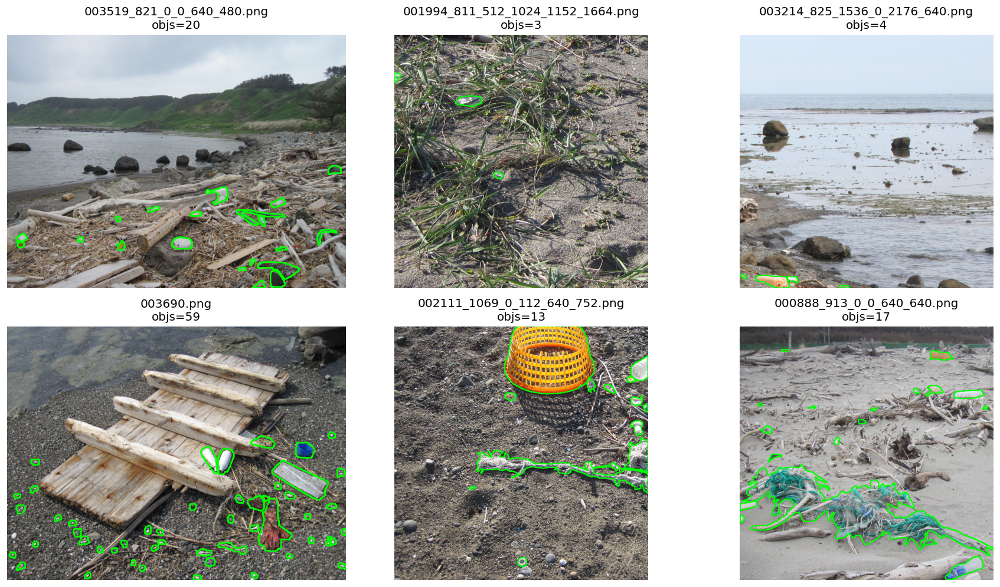


Preview: val (images=2786 labeled=2386 background=400)


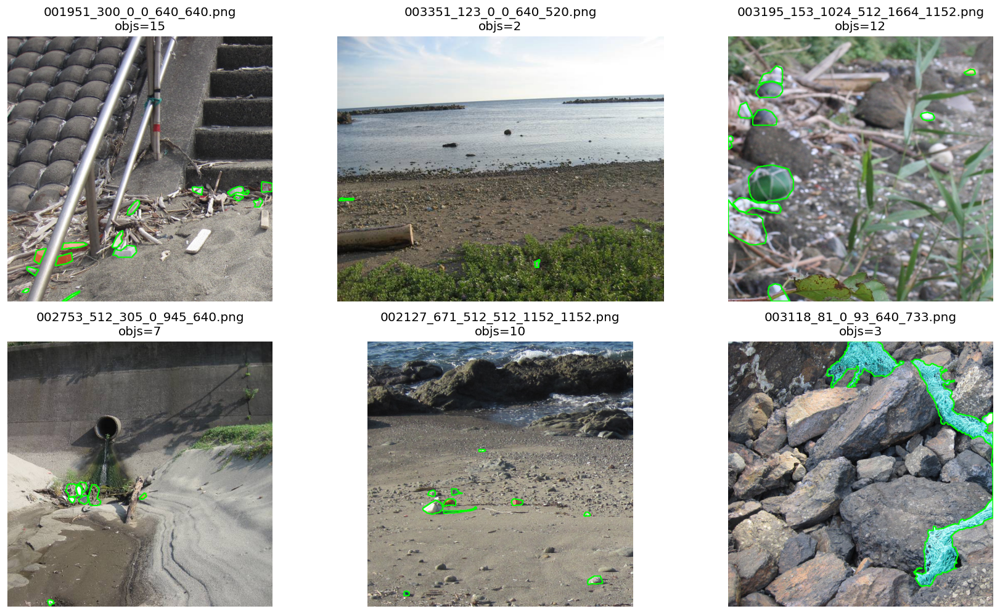


Preview: test (images=3045 labeled=2437 background=608)


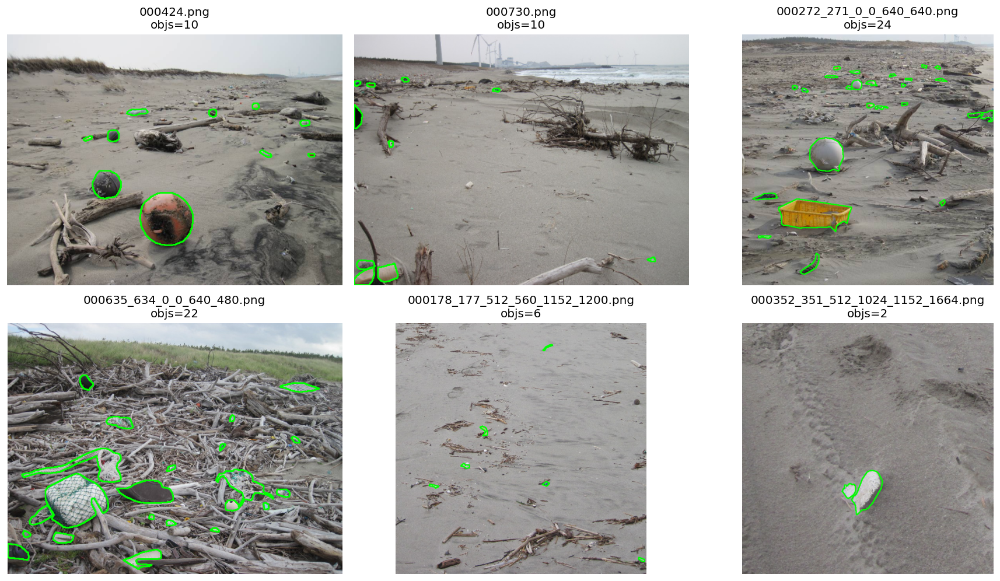

In [23]:
import random
from pathlib import Path
from typing import Optional
import cv2
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# Reuse IMG_EXTS if available from above cells; otherwise set defaults.
try:
    _IMG_EXTS = IMG_EXTS  # noqa: F821
except Exception:
    _IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

def _find_image_path(images_dir: Path, stem: str) -> Optional[Path]:
    for ext in _IMG_EXTS:
        p = images_dir / f"{stem}{ext}"
        if p.exists():
            return p
    # fallback: any file matching stem
    if images_dir.exists():
        for p in images_dir.iterdir():
            if p.is_file() and p.stem == stem and p.suffix.lower() in _IMG_EXTS:
                return p
    return None

def _parse_yolo_lines(label_text: str) -> list[list[float]]:
    """Return list of numeric tokens per line (including class id as first token)."""
    items: list[list[float]] = []
    for line in label_text.splitlines():
        s = line.strip()
        if not s:
            continue
        parts = s.split()
        try:
            nums = [float(x) for x in parts]
        except ValueError:
            continue
        if len(nums) >= 5:
            items.append(nums)
    return items

def _draw_overlay(img_bgr, yolo_items: list[list[float]], color=(0, 255, 0), max_objects: int = 50):
    """Draw bbox or polygon segments on image (returns a drawn copy)."""
    out = img_bgr.copy()
    h, w = out.shape[:2]
    count = 0
    for nums in yolo_items:
        if count >= max_objects:
            break
        coords = nums[1:]
        if len(coords) == 4:
            # bbox: cx cy bw bh (normalized)
            cx, cy, bw, bh = coords
            x1 = int(round((cx - bw / 2.0) * w))
            y1 = int(round((cy - bh / 2.0) * h))
            x2 = int(round((cx + bw / 2.0) * w))
            y2 = int(round((cy + bh / 2.0) * h))
            x1 = max(0, min(w - 1, x1))
            y1 = max(0, min(h - 1, y1))
            x2 = max(0, min(w - 1, x2))
            y2 = max(0, min(h - 1, y2))
            cv2.rectangle(out, (x1, y1), (x2, y2), color, 2)
            count += 1
            continue

        # segmentation polygon: x1 y1 x2 y2 ... (normalized)
        if len(coords) >= 6 and (len(coords) % 2 == 0):
            pts = []
            for i in range(0, len(coords), 2):
                x = int(round(coords[i] * w))
                y = int(round(coords[i + 1] * h))
                pts.append([max(0, min(w - 1, x)), max(0, min(h - 1, y))])
            if len(pts) >= 3:
                pts_np = np.array(pts, dtype=np.int32).reshape((-1, 1, 2))
                cv2.polylines(out, [pts_np], isClosed=True, color=color, thickness=2)
                count += 1
    return out

def preview_final_dataset(
    final_root: str,
    splits=("train", "val", "test"),
    samples_per_split: int = 6,
    seed: int = 0,
    max_objects_per_image: int = 50,
    prefer_labeled: bool = True,
    ):
    """
    Show a grid of random images from FINAL_OUTPUT_DIR with YOLO overlays.

    - If prefer_labeled=True: samples from images that have non-empty labels first (when possible).
    - Also shows some background-only examples when available.
    """
    base = Path(final_root)
    images_base = base / "images"
    labels_base = base / "labels"

    rng = random.Random(seed)
    plt.rcParams["figure.dpi"] = 120

    for split in splits:
        images_dir = images_base / split
        labels_dir = labels_base / split
        if not images_dir.exists():
            print(f"- {split}: images dir missing ({images_dir})")
            continue
        labels_dir.mkdir(parents=True, exist_ok=True)

        image_paths = sorted([p for p in images_dir.iterdir() if p.is_file() and p.suffix.lower() in _IMG_EXTS])
        if not image_paths:
            print(f"- {split}: no images found")
            continue

        # Partition into labeled/background (best-effort)
        labeled: list[Path] = []
        background: list[Path] = []
        for img_path in image_paths:
            lp = labels_dir / f"{img_path.stem}.txt"
            if not lp.exists():
                background.append(img_path)
                continue
            try:
                txt = lp.read_text(encoding="utf-8").strip()
            except Exception:
                txt = lp.read_bytes().decode("utf-8", errors="ignore").strip()
            if txt:
                labeled.append(img_path)
            else:
                background.append(img_path)

        if prefer_labeled and labeled:
            primary = labeled
            secondary = background
        else:
            primary = image_paths
            secondary = []

        chosen: list[Path] = []
        if primary:
            chosen.extend(rng.sample(primary, k=min(samples_per_split, len(primary))))
        # If we didn't fill quota and we have secondary, top up from it
        if len(chosen) < samples_per_split and secondary:
            need = samples_per_split - len(chosen)
            pool = [p for p in secondary if p not in chosen]
            if pool:
                chosen.extend(rng.sample(pool, k=min(need, len(pool))))

        n = len(chosen)
        cols = min(3, max(1, n))
        rows = (n + cols - 1) // cols
        fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4.2 * rows))
        axes_flat = np.array(axes).ravel()
        for ax in axes_flat[n:]:
            ax.axis("off")

        print(f"\nPreview: {split} (images={len(image_paths)} labeled={len(labeled)} background={len(background)})")
        for i, img_path in enumerate(chosen):
            ax = axes_flat[i]
            label_path = labels_dir / f"{img_path.stem}.txt"
            label_txt = ""
            if label_path.exists():
                try:
                    label_txt = label_path.read_text(encoding="utf-8")
                except Exception:
                    label_txt = label_path.read_bytes().decode("utf-8", errors="ignore")
            yolo_items = _parse_yolo_lines(label_txt)
            img_bgr = cv2.imread(str(img_path))
            if img_bgr is None:
                ax.set_title(f"{img_path.name} (unreadable)")
                ax.axis("off")
                continue
            over = _draw_overlay(img_bgr, yolo_items, color=(0, 255, 0), max_objects=max_objects_per_image)
            img_rgb = cv2.cvtColor(over, cv2.COLOR_BGR2RGB)
            ax.imshow(img_rgb)
            ax.axis("off")
            ax.set_title(f"{img_path.name}\nobjs={len(yolo_items)}")

        plt.tight_layout()
        plt.show()

# ============== EXECUTION ==============
preview_final_dataset(
    FINAL_OUTPUT_DIR,
    splits=[s for s, *_ in DATA_SPLITS],
    samples_per_split=6,
    seed=0,
    max_objects_per_image=50,
    prefer_labeled=True,
 )